# Lab 6 - PCC177/BCC406

## REDES NEURAIS E APRENDIZAGEM EM PROFUNDIDADE

## Modelos Generativos

### Prof. Eduardo e Prof. Pedro

### Aluna: Daniela Costa Terra

Objetivos:

- Parte I : Compressão com AE

- Parte II : Detecção de anomalias

- Parte III: Redes Generativas Adversariais

Data da entrega : XX/XX 

- Complete o código (marcado com ToDo) e quando requisitado, escreva textos diretamente nos notebooks. Onde tiver *None*, substitua pelo seu código.
- Execute todo notebook e salve tudo em um PDF **nomeado** como "NomeSobrenome-Lab.pdf"
- Envie o PDF via google [FORM](https://forms.gle/yDaQVawQJentRZTy9)

Este notebook é baseado em tensorflow e Keras.


# Parte I: Autoencoder para redução de dimensionalidade (30pt)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

Carrega dataset Fashon MNIST dataset. 
Cada imagem tem resolução 28x28 pixels. 

In [2]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.

print (x_train.shape)
print (x_test.shape)

4431872/4422102 [==============================] - 0s 0us/step
(60000, 28, 28)
(10000, 28, 28)


## Exemplo de classes
![mnist fashion](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/intro_autoencoder_result.png?raw=1)




Abaixo exemplo de implementação de autoencoder apena com camadas densas. O  `encoder`, comprime as imegns em 4 dimensões (latent_dim), e o `decoder` reconstróe a imagem a partir do vetor latente.

O exemplo abaixo usa a [Keras Model Subclassing API](https://www.tensorflow.org/guide/keras/custom_layers_and_models).

In [3]:
latent_dim = 4 

class Autoencoder(Model):
  def __init__(self, latent_dim):
    super(Autoencoder, self).__init__()
    self.latent_dim = latent_dim   
    self.encoder = tf.keras.Sequential([
      layers.Flatten(),
      layers.Dense(latent_dim, activation='relu'),
    ])
    self.decoder = tf.keras.Sequential([
      layers.Dense(784, activation='sigmoid'),
      layers.Reshape((28, 28))
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded
  
autoencoder = Autoencoder(latent_dim) 

In [4]:
autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [5]:
autoencoder.fit(x_train, x_train,
                epochs=10,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.0502 - val_loss: 0.0378
Epoch 2/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0355 - val_loss: 0.0341
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0336 - val_loss: 0.0332
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0331 - val_loss: 0.0329
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0328 - val_loss: 0.0327
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0327 - val_loss: 0.0326
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0326 - val_loss: 0.0326
Epoch 8/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0326 - val_loss: 0.0327
Epoch 9/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0326 - val_loss: 0.0326
Epoch 10/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.032



Treine o modelo e veja os resultados da re-construção.

In [6]:
encoded_imgs = autoencoder.encoder(x_test).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()

In [7]:
## Código para gráficos alterado (Daniela)
def showTest(decoded_imgs):
  n = 10
  plt.figure(figsize=(20, 4))
  for i in range(n):
    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i])
    plt.title("original")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i])
    plt.title("reconstructed")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
  plt.show()

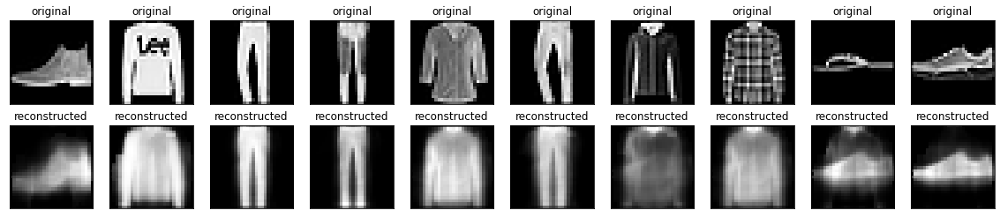

In [8]:
## Teste com latent_dim = 4
showTest(decoded_imgs)

## ToDo : Testes (15pt)

### Faça testes com vetor latente de dimensões 2, 8, 16 e 64.

In [9]:
def encoderDecoder(latent_dim):
      autoencoder = Autoencoder(latent_dim) 
      autoencoder.compile(optimizer='adam', loss=losses.MeanSquaredError())
      autoencoder.fit(x_train, x_train,
                  epochs=10,
                  shuffle=True,
                  validation_data=(x_test, x_test))

      encoded_imgs = autoencoder.encoder(x_test).numpy()
      decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()
      return (encoded_imgs, decoded_imgs)

Epoch 1/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0683 - val_loss: 0.0569
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0532 - val_loss: 0.0494
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0473 - val_loss: 0.0455
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0450 - val_loss: 0.0446
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0445 - val_loss: 0.0443
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0444 - val_loss: 0.0442
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0443 - val_loss: 0.0443
Epoch 8/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0443 - val_loss: 0.0442
Epoch 9/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0442 - val_loss: 0.0441
Epoch 10/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.044

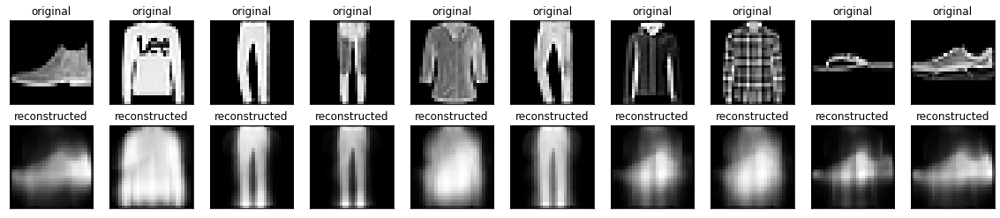

In [10]:
## Vetor latente (latent_dim = 2):
(encoded_dim2, decoded_dim2) = encoderDecoder(2)
showTest(decoded_dim2)

Epoch 1/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.0421 - val_loss: 0.0289
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0270 - val_loss: 0.0258
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0255 - val_loss: 0.0252
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0251 - val_loss: 0.0250
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0249 - val_loss: 0.0248
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0248 - val_loss: 0.0247
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0247 - val_loss: 0.0247
Epoch 8/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0247 - val_loss: 0.0248
Epoch 9/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0247 - val_loss: 0.0247
Epoch 10/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.024

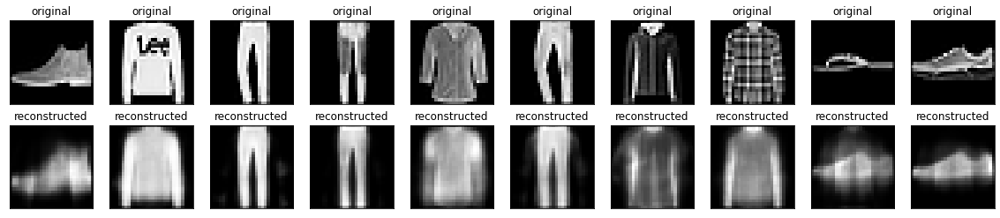

In [11]:
## Vetor latente (latent_dim = 8):
 
(encoded_dim8, decoded_dim8) = encoderDecoder(8)
showTest(decoded_dim8)

Epoch 1/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0343 - val_loss: 0.0216
Epoch 2/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0196 - val_loss: 0.0185
Epoch 3/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.0182 - val_loss: 0.0181
Epoch 4/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.0179 - val_loss: 0.0178
Epoch 5/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.0177 - val_loss: 0.0177
Epoch 6/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0176 - val_loss: 0.0178
Epoch 7/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0175 - val_loss: 0.0175
Epoch 8/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0175 - val_loss: 0.0175
Epoch 9/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0174 - val_loss: 0.0175
Epoch 10/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.017

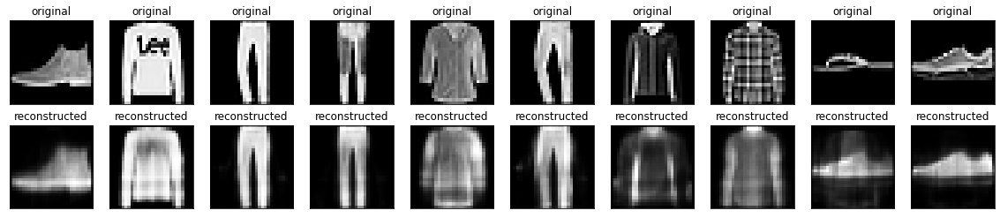

In [12]:
## Vetor latente (latent_dim = 16):
(encoded_dim16, decoded_dim16) = encoderDecoder(16)
showTest(decoded_dim16)

Epoch 1/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0240 - val_loss: 0.0134
Epoch 2/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0118 - val_loss: 0.0108
Epoch 3/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0103 - val_loss: 0.0099
Epoch 4/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0096 - val_loss: 0.0095
Epoch 5/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0093 - val_loss: 0.0092
Epoch 6/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 7/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0089 - val_loss: 0.0091
Epoch 8/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0089 - val_loss: 0.0089
Epoch 9/10
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0088 - val_loss: 0.0089
Epoch 10/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.008

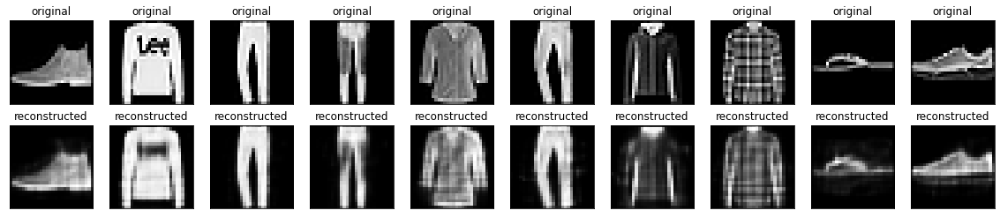

In [13]:
## Vetor latente (latent_dim = 64):
(encoded_dim64, decoded_dim64) = encoderDecoder(64)
showTest(decoded_dim64)

## ToDo : Responda (15pt)

Escreva suas conclusões sobre os testes executados:

É perceptível para enconders com poucas dimensões latentes, como 2, 4, 8 e 16 que há uma tendência da rede em codificar de forma semelhante imagens semelhantes para objetos de mesma classe. É a idéia de continuidade: pontos que são próximos no espaço latente terão conteúdo similar após decodificação. Por exemplo, com 2, 4 e 8 dimensões a rede exibiu imagens de calças e blusas com basicamente a mesma forma/textura. Para as duas últimas figuras, chinelo e tennis, as redes de até 16 dimensões também exibem as imagens correspondentes com a mesma aparência (de tennis). Apenas com 64 dimensões no enconder a imagem desses objetos são diferenciados e a rede começa produzir imagens mais próximas da imagem real de entrada (completude). 

# Parte II: Detecção de anomalias (30pt)


## Intro

Neste exemplo, você vai detectar anomalis em sinaos de eletrocardiograma (ECG). Para tal, treine um autoencoder no dataset [ECG5000 dataset](http://www.timeseriesclassification.com/description.php?Dataset=ECG5000). Este dataset contém 5000 batimentos de ECG (https://en.wikipedia.org/wiki/Electrocardiography), cada um com 140 amostras (pontos) na curva. Cada instância da base de dados (um batimento) foi rotulado como zero (0) ou um (1). A classe zero corresponde a um batimento anormal e a classe um a um batimento de classe normal. Queremos identificar os anormais.

Para detectar anomalias usando um autoencoder você deve treinar um autoencoder apenas em batimentos normais. Ele vai aprender a re-construir os batimentos saudáveis. A hipóteses é que os batimentos anormais vão divergir no padrão, quando compararmos a entrada com a re-construção. 

## Carrega base de ECG

Base de dados detalhada no site: [timeseriesclassification.com](http://www.timeseriesclassification.com/description.php?Dataset=ECG5000).


In [14]:
# Download the dataset
dataframe = pd.read_csv('http://storage.googleapis.com/download.tensorflow.org/data/ecg.csv', header=None)
raw_data = dataframe.values
dataframe.head() 

,0,1,2,3,4,5,6,7,8,9,...,131,132,133,134,135,136,137,138,139,140
0,-0.112522,-2.827204,-3.773897,-4.349751,-4.376041,-3.474986,-2.181408,-1.818286,-1.250522,-0.477492,...,0.792168,0.933541,0.796958,0.578621,0.257740,0.228077,0.123431,0.925286,0.193137,1.0
1,-1.100878,-3.996840,-4.285843,-4.506579,-4.022377,-3.234368,-1.566126,-0.992258,-0.754680,0.042321,...,0.538356,0.656881,0.787490,0.724046,0.555784,0.476333,0.773820,1.119621,-1.436250,1.0
2,-0.567088,-2.593450,-3.874230,-4.584095,-4.187449,-3.151462,-1.742940,-1.490659,-1.183580,-0.394229,...,0.886073,0.531452,0.311377,-0.021919,-0.713683,-0.532197,0.321097,0.904227,-0.421797,1.0
3,0.490473,-1.914407,-3.616364,-4.318823,-4.268016,-3.881110,-2.993280,-1.671131,-1.333884,-0.965629,...,0.350816,0.499111,0.600345,0.842069,0.952074,0.990133,1.086798,1.403011,-0.383564,1.0
4,0.800232,-0.874252,-2.384761,-3.973292,-4.338224,-3.802422,-2.534510,-1.783423,-1.594450,-0.753199,...,1.148884,0.958434,1.059025,1.371682,1.277392,0.960304,0.971020,1.614392,1.421456,1.0


In [15]:
# The last element contains the labels
labels = raw_data[:, -1]

# The other data points are the electrocadriogram data
data = raw_data[:, 0:-1]

train_data, test_data, train_labels, test_labels = train_test_split(
    data, labels, test_size=0.2, random_state=21
)


Normaliza entre `[0,1]`.


In [16]:
min_val = tf.reduce_min(train_data)
max_val = tf.reduce_max(train_data)

train_data = (train_data - min_val) / (max_val - min_val)
test_data = (test_data - min_val) / (max_val - min_val)

train_data = tf.cast(train_data, tf.float32)
test_data = tf.cast(test_data, tf.float32)

Vamos separar os batimentos normais (label 1) para treinar o Autoencoder.

In [17]:
train_labels = train_labels.astype(bool)
test_labels = test_labels.astype(bool)

normal_train_data = train_data[train_labels]
normal_test_data = test_data[test_labels]

anomalous_train_data = train_data[~train_labels]
anomalous_test_data = test_data[~test_labels]

Plote um batimento normal. 

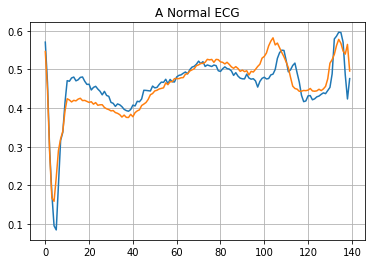

In [18]:
plt.grid()
plt.plot(np.arange(140), normal_train_data[0], normal_train_data[5])
plt.title("A Normal ECG")
plt.show()

Plote um batimento anômalo.

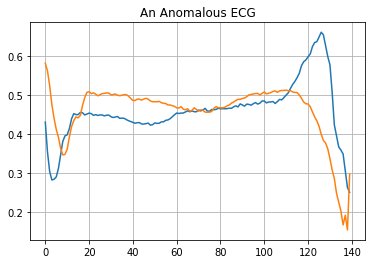

In [19]:
plt.grid()
plt.plot(np.arange(140), anomalous_train_data[0], anomalous_train_data[5])
plt.title("An Anomalous ECG")
plt.show()

## ToDo : Construção de um modelo (30pt)

Construa um modelo. Primeiramente tente construir apenas com camadas densas. Depois, tente construir um modelo com camadas de convolução de uma dimensão (Lembre-se que um sinal de ECG é uma série temporal de uma dimensão). [Conv1D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv1D)

In [20]:
## Expande dim dos dados de entrada: para cada batimento são 140 séries temporais de 1 features (140,1) 
normal_train_data = tf.expand_dims(normal_train_data, axis=2)
normal_test_data = tf.expand_dims(normal_test_data, axis=2)

normal_train_data.shape, normal_test_data.shape

(TensorShape([2359, 140, 1]), TensorShape([560, 140, 1]))

### Testes Autoencoders: camadas densas (D) e convoluções (C) testadas em paralelo

In [39]:
#  Anomaly detector (Dense net)
class AnomalyDenseDetector(Model):
  def __init__(self, units_dense1, units_dense2, latent_dim):
    super(AnomalyDenseDetector, self).__init__()
    self.units_dense1 = units_dense1
    self.units_dense2 = units_dense2
    self.latent_dim = latent_dim   
    # Todo: crie o encoder, com um gargalo
    self.encoder = tf.keras.Sequential([
      layers.Flatten(),
      layers.Dense(units_dense1, activation='relu'),
      layers.Dense(units_dense2, activation='relu'),
      layers.Dense(latent_dim, activation='relu'),
    ])
    # Todo: crie as camadas do decoder
    self.decoder = tf.keras.Sequential([
      layers.Dense(units_dense2, activation='relu'),                                  
      layers.Dense(units_dense1, activation='relu'),                                  
      layers.Dense(140, activation='sigmoid'),
      layers.Reshape((140, 1))
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

#  Anomaly detector (Convolucional net)
class AnomalyConvDetector(Model):
  def __init__(self, n_filters1, n_filters2):   # dimensões latentes (35)
    super(AnomalyConvDetector, self).__init__()
    self.n_filters1 = n_filters1
    self.n_filters2 = n_filters2
    # Todo: crie o encoder, com um gargalo
    self.encoder = tf.keras.Sequential([
      layers.Conv1D(n_filters1, 2, strides=2),
      layers.Conv1D(n_filters2, 2, strides=2,activation='relu'),
      layers.Conv1D(1,1,activation='relu'),
    ])
    # Todo: crie as camadas do decoder
    self.decoder = tf.keras.Sequential([
      layers.Conv1DTranspose(n_filters2, 2, strides=2, activation='relu'), 
      layers.Conv1DTranspose(n_filters1, 2, strides=2),
      layers.Flatten(),
      layers.Dense(140, activation='sigmoid'),
      layers.Reshape((140, 1))
    ])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded


In [40]:
autoencoderD = AnomalyDenseDetector(280, 110, 30)

autoencoderC = AnomalyConvDetector(256, 512)

In [41]:
autoencoderD.compile(optimizer='adam', loss='mae')

autoencoderC.compile(optimizer='adam', loss='mae')


Depois de treinar com os batimentos normais, avalie com os anormais.

In [42]:
historyD = autoencoderD.fit(normal_train_data, normal_train_data, 
          epochs=20, 
          batch_size=512,
          validation_data=(test_data, test_data),
          shuffle=True)

Epoch 1/20
5/5 [==============================] - 1s 111ms/step - loss: 0.0563 - val_loss: 0.0487
Epoch 2/20
5/5 [==============================] - 0s 36ms/step - loss: 0.0414 - val_loss: 0.0408
Epoch 3/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0315 - val_loss: 0.0380
Epoch 4/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0273 - val_loss: 0.0366
Epoch 5/20
5/5 [==============================] - 0s 27ms/step - loss: 0.0250 - val_loss: 0.0351
Epoch 6/20
5/5 [==============================] - 0s 25ms/step - loss: 0.0234 - val_loss: 0.0335
Epoch 7/20
5/5 [==============================] - 0s 27ms/step - loss: 0.0219 - val_loss: 0.0328
Epoch 8/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0209 - val_loss: 0.0329
Epoch 9/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0204 - val_loss: 0.0324
Epoch 10/20
5/5 [==============================] - 0s 25ms/step - loss: 0.0201 - val_loss: 0.0314
Epoch 11/20
5/5 [===========

In [43]:
historyC = autoencoderC.fit(normal_train_data, normal_train_data, 
          epochs=20, 
          batch_size=512,
          validation_data=(normal_test_data, normal_test_data),
          shuffle=True)

Epoch 1/20
5/5 [==============================] - 18s 3s/step - loss: 0.0499 - val_loss: 0.0377
Epoch 2/20
5/5 [==============================] - 14s 3s/step - loss: 0.0309 - val_loss: 0.0263
Epoch 3/20
5/5 [==============================] - 14s 3s/step - loss: 0.0244 - val_loss: 0.0216
Epoch 4/20
5/5 [==============================] - 16s 3s/step - loss: 0.0224 - val_loss: 0.0212
Epoch 5/20
5/5 [==============================] - 15s 3s/step - loss: 0.0216 - val_loss: 0.0215
Epoch 6/20
5/5 [==============================] - 14s 3s/step - loss: 0.0212 - val_loss: 0.0208
Epoch 7/20
5/5 [==============================] - 14s 3s/step - loss: 0.0209 - val_loss: 0.0204
Epoch 8/20
5/5 [==============================] - 14s 3s/step - loss: 0.0207 - val_loss: 0.0203
Epoch 9/20
5/5 [==============================] - 14s 3s/step - loss: 0.0206 - val_loss: 0.0204
Epoch 10/20
5/5 [==============================] - 14s 3s/step - loss: 0.0206 - val_loss: 0.0202
Epoch 11/20
5/5 [======================

Text(0.5, 1.0, 'Conv Autoencoder')

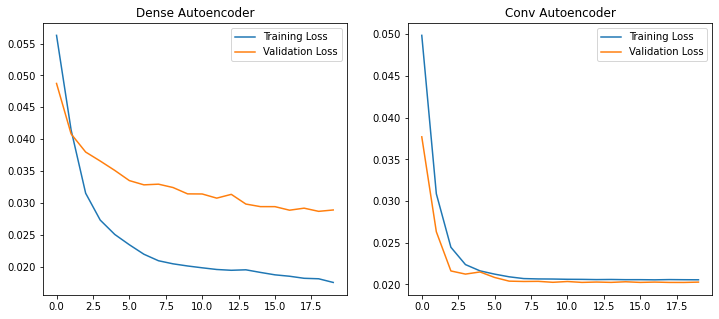

In [44]:
 
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))
 
ax1.plot(historyD.history["loss"], label="Training Loss ")
ax1.plot(historyD.history["val_loss"], label="Validation Loss")
ax1.legend()
ax1.set_title("Dense Autoencoder") 

ax2.plot(historyC.history["loss"], label="Training Loss ")
ax2.plot(historyC.history["val_loss"], label="Validation Loss")
ax2.legend()
ax2.set_title("Conv Autoencoder") 


Você vai considerar um batimento como anômalo se ele divergir masi que um desvio padrão das amostras normais. Primeiro, vamos plotar um batimento normal a partir da base de treino e sua reconstrução. Assim, poderemos calcular o erro de re-construção.

Text(0.5, 1.0, 'Conv Autoencoder')

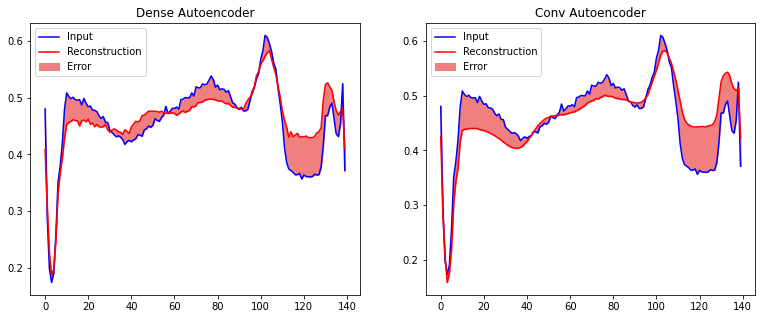

In [45]:
## Dense Autoencoder
encoded_dataD = autoencoderD.encoder(normal_test_data).numpy()
decoded_dataD = autoencoderD.decoder(encoded_dataD).numpy()

normal_test_data_sample = tf.squeeze(normal_test_data[0])
decoded_data_sampleD = tf.squeeze(decoded_dataD[0])

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,5))
ax1.plot(normal_test_data_sample, 'b')
ax1.plot(decoded_data_sampleD, 'r')
ax1.fill_between(np.arange(140), decoded_data_sampleD, normal_test_data_sample, color='lightcoral')
ax1.legend(labels=["Input", "Reconstruction", "Error"])
ax1.set_title("Dense Autoencoder")

##  Conv Autoencoder
encoded_dataC = autoencoderC.encoder(normal_test_data).numpy()
decoded_dataC = autoencoderC.decoder(encoded_dataC).numpy()
decoded_data_sampleC = tf.squeeze(decoded_dataC[0])

ax2.plot(normal_test_data_sample, 'b')
ax2.plot(decoded_data_sampleC, 'r')
ax2.fill_between(np.arange(140), decoded_data_sampleC, normal_test_data_sample, color='lightcoral')
ax2.legend(labels=["Input", "Reconstruction", "Error"]) 
ax2.set_title("Conv Autoencoder")



Vamos fazer o mesmo para um batimento anômalo.

Text(0.5, 1.0, 'Conv Autoencoder')

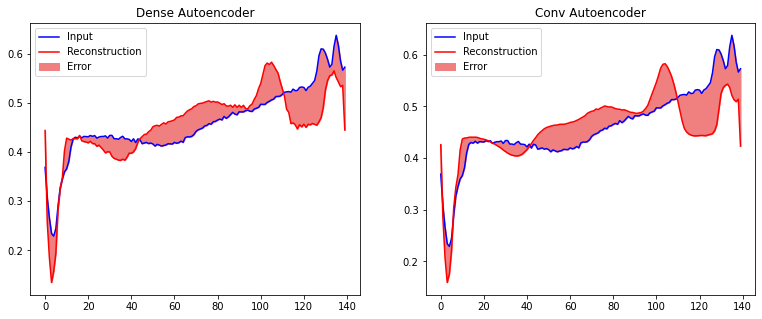

In [46]:
encoded_dataD = autoencoderD.encoder(anomalous_test_data).numpy()
decoded_dataD = autoencoderD.decoder(encoded_dataD).numpy()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,5))

ax1.plot(tf.squeeze(anomalous_test_data[0]), 'b')
ax1.plot(tf.squeeze(decoded_dataD[0]), 'r')
ax1.fill_between(np.arange(140), tf.squeeze(decoded_dataD[0]), tf.squeeze(anomalous_test_data[0]), color='lightcoral')
ax1.legend(labels=["Input", "Reconstruction", "Error"])
ax1.set_title("Dense Autoencoder")

##  Conv Autoencoder
encoded_dataC = autoencoderC.encoder(anomalous_test_data).numpy()
decoded_dataC = autoencoderC.decoder(encoded_dataC).numpy()

ax2.plot(tf.squeeze(anomalous_test_data[0]), 'b')
ax2.plot(tf.squeeze(decoded_dataC[0]), 'r')
ax2.fill_between(np.arange(140), tf.squeeze(decoded_dataC[0]), tf.squeeze(anomalous_test_data[0]), color='lightcoral')
ax2.legend(labels=["Input", "Reconstruction", "Error"])
ax2.set_title("Conv Autoencoder")


## Detectando as anomalias

Vamos detectar as anomalis se o erro de reconstrução for maior que um limiar. Aqui, vamos calcular o erro médio para os exemp;los normais do treino e depois, classificar os anormais do teste, que tenha erro de reconstrução maior que um desvio padrão. 


Plota erro de reconstrução de batimentos normais do treino

Text(0.5, 1.0, 'Conv Autoencoder')

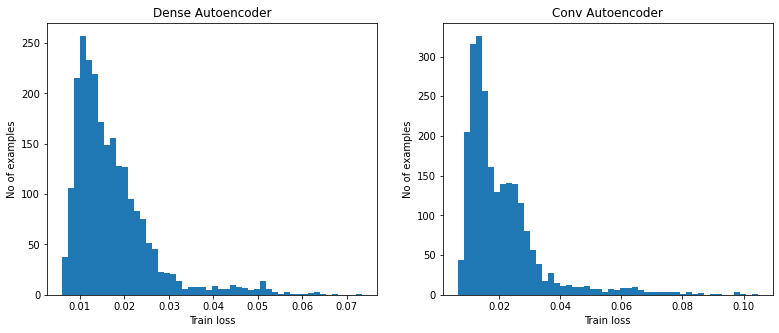

In [47]:
reconstructionsD = autoencoderD.predict(normal_train_data)
train_lossD = tf.keras.losses.mae(tf.squeeze(reconstructionsD), tf.squeeze(normal_train_data))
 
reconstructionsC = autoencoderC.predict(normal_train_data)
train_lossC = tf.keras.losses.mae(tf.squeeze(reconstructionsC), tf.squeeze(normal_train_data))
 
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))
ax1.hist(train_lossD[None,:], bins=50)
ax1.set_xlabel("Train loss")
ax1.set_ylabel("No of examples")
ax1.set_title("Dense Autoencoder")

ax2.hist(train_lossC[None,:], bins=50)
ax2.set_xlabel("Train loss")
ax2.set_ylabel("No of examples")
ax2.set_title("Conv Autoencoder")
 

Escolha do limiar.

In [48]:
thresholdD = np.mean(train_lossD) + np.std(train_lossD)
print("Threshold Dense: ", thresholdD)

thresholdC = np.mean(train_lossC) + np.std(train_lossC)
print("Threshold Conv: ", thresholdC)

Threshold Dense:  0.026340492
Threshold Conv:  0.03315819


Text(0.5, 1.0, 'Conv Autoencoder')

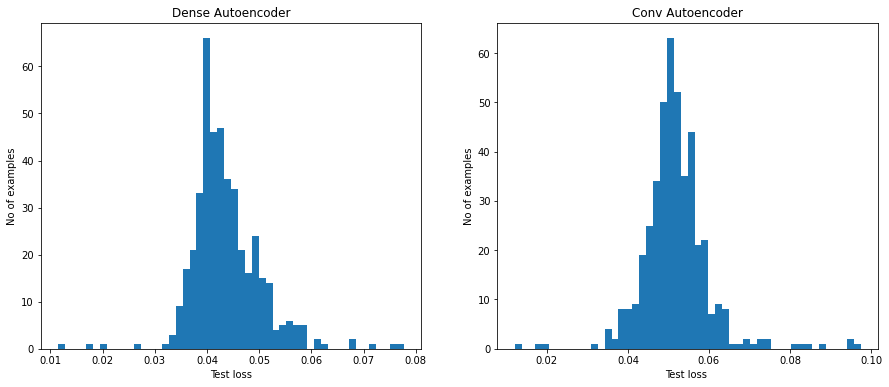

In [49]:
reconstructionsD = autoencoderD.predict(anomalous_test_data)
test_lossD = tf.keras.losses.mae(tf.squeeze(reconstructionsD), tf.squeeze(anomalous_test_data))

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
ax1.hist(test_lossD[None, :], bins=50)
ax1.set_xlabel("Test loss")
ax1.set_ylabel("No of examples")
ax1.set_title("Dense Autoencoder")

reconstructionsC = autoencoderC.predict(anomalous_test_data)
test_lossC = tf.keras.losses.mae(tf.squeeze(reconstructionsC), tf.squeeze(anomalous_test_data))

ax2.hist(test_lossC[None, :], bins=50)
ax2.set_xlabel("Test loss ")
ax2.set_ylabel("No of examples")
ax2.set_title("Conv Autoencoder")

Classificação.

In [50]:
def predict(model, data, threshold):
  reconstructions = model(data)
  loss = tf.keras.losses.mae(tf.squeeze(reconstructions), tf.squeeze(data))
  return tf.math.less(loss, threshold)

def print_stats(predictions, labels, type):
  print("\nAccuracy({}) = {}".format(type, accuracy_score(labels, predictions)))
  print("Precision({}) = {}".format(type, precision_score(labels, predictions)))
  print("Recall({}) = {}".format(type, recall_score(labels, predictions)))

Calcule a acurácia para os dois modelos (com camadas densas e convolucionais)

In [51]:
predsD = predict(autoencoderD, test_data, thresholdD)
print_stats(predsD, test_labels, "Dense")

predsC = predict(autoencoderC, test_data, thresholdC)
print_stats(predsC, test_labels, "Conv")


Accuracy(Dense) = 0.935
Precision(Dense) = 0.9940119760479041
Recall(Dense) = 0.8892857142857142

Accuracy(Conv) = 0.944
Precision(Conv) = 0.9921875
Recall(Conv) = 0.9071428571428571


#Parte III: Redes Generativas Adversariais (40pt)

Leia o tutorial sobre a pix2pix em [Tensofrflow Tutorials](https://www.tensorflow.org/tutorials/generative/pix2pix). O pix2pix foi apresentado em [Image-to-image translation with conditional adversarial networks by Isola et al. (2017)](https://arxiv.org/abs/1611.07004) e se trata de uma rede generativa adversarial condicional para geração de fachadas de prédios condicionada a uma máscara reprtesentando a arquitetura. baixe o noterbook do tutorial, estude e treine a GAN. Após o treinamento, construa você mesmo 3 máscaras (usando algum software de desenho) e faça uma inferência com a rede. Anexe no notebook a máscara e sua respectiva saída. 

## ToDo : Fachadas de prédios (40pt)

In [ ]:
# ToDO : Criar 3 máscaras e gerar 3 saídas com a pix2pix para o problema de fachadas de prédios.

### Cópia do código [pix2pix](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb#scrollTo=lFPI4Nu-8b4q)

(código executado com GPU)


 

In [1]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
dataset_name = "facades" #@param ["cityscapes", "edges2handbags", "edges2shoes", "facades", "maps", "night2day"]

In [5]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

30179328/30168306 [==============================] - 18s 1us/step


In [6]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/facades'),
 PosixPath('/root/.keras/datasets/facades.tar.gz')]

(256, 512, 3)


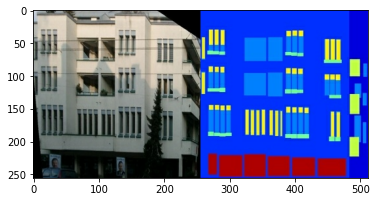

In [7]:
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)
plt.figure()
plt.imshow(sample_image)

In [8]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

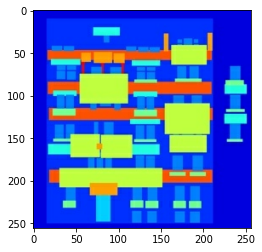

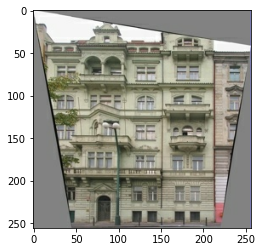

In [9]:
inp, re = load(str(PATH / 'train/100.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

*Pré-processamento:*

In [10]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [11]:
OUTPUT_CHANNELS = 3

In [12]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

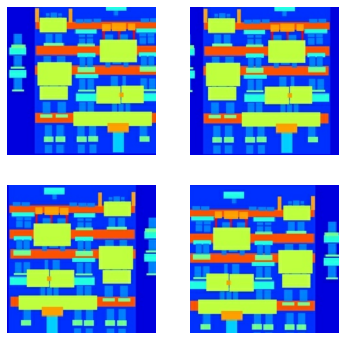

In [13]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

*Carrega bancos:*

In [14]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [15]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

*Gerador (downsample e upsample):*

In [16]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [17]:
#teste downsample
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [18]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [19]:
#teste upsample
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [20]:
# Define o Gerador:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

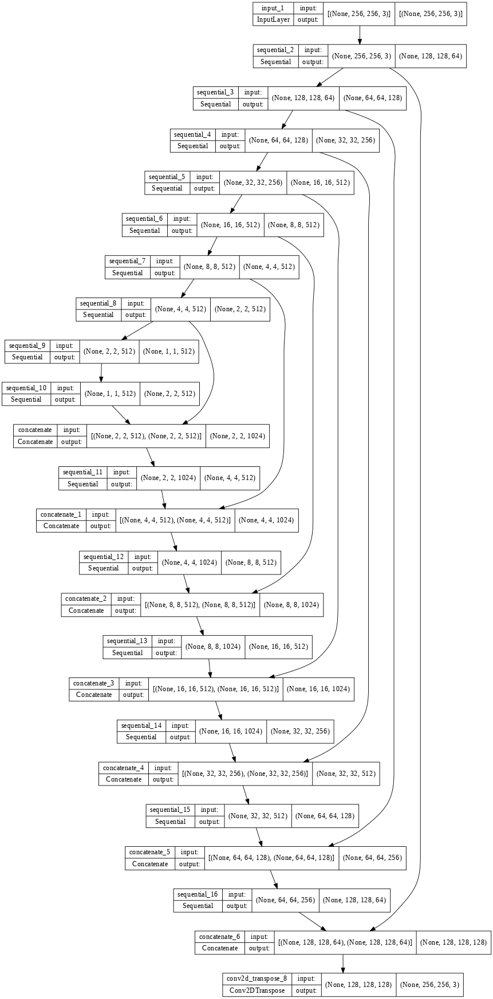

In [21]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


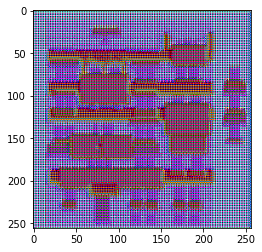

In [22]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [23]:
# Função de perda do gerador:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [24]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

*Discriminador:*

In [25]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

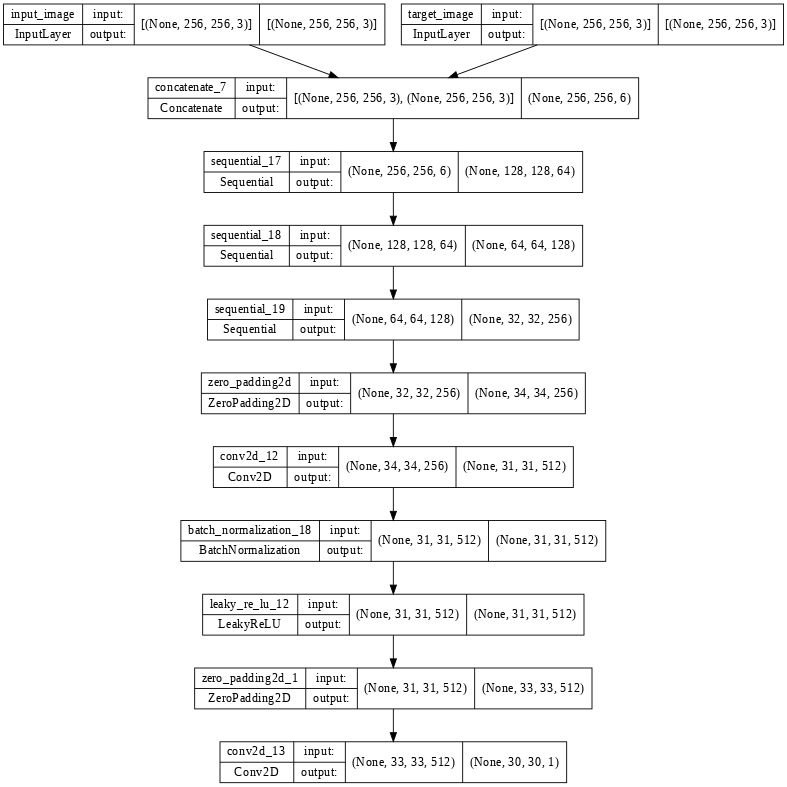

In [26]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

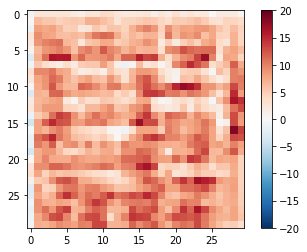

In [27]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()


In [28]:
# Função de perda (Discrimidador)

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss
 

In [29]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [30]:
#checkpoint_dir = './training_checkpoints'
checkpoint_dir ='/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [31]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


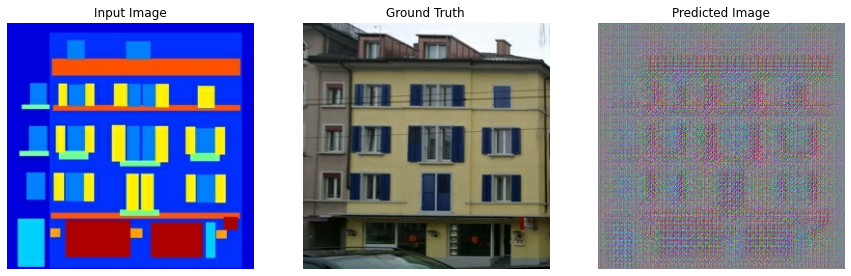

In [32]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)


*Treinamento:*

In [33]:
log_dir="/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


In [34]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [35]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)


In [ ]:
#!rm -rf ./logs/ 

In [36]:
%load_ext tensorboard

In [37]:
%tensorboard --logdir {log_dir}  

Output hidden; open in https://colab.research.google.com to view.

Time taken for 1000 steps: 95.24 sec



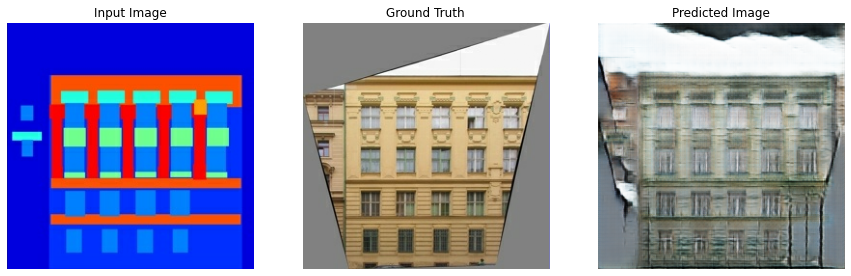

Step: 39k
....................................................................................................

In [38]:
fit(train_dataset, test_dataset, steps=40000)

In [40]:
!tensorboard dev upload --logdir '{log_dir}'


***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/logs/

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email&state=GhG

In [42]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

In [43]:
print(checkpoint_dir)
! ls '{checkpoint_dir}'
#! ls '/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/training_checkpoints'

/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/training_checkpoints
checkpoint		    ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index		    ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index		    ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index		    ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [45]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

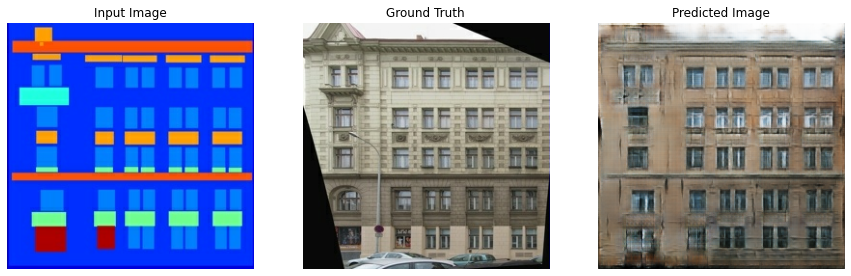

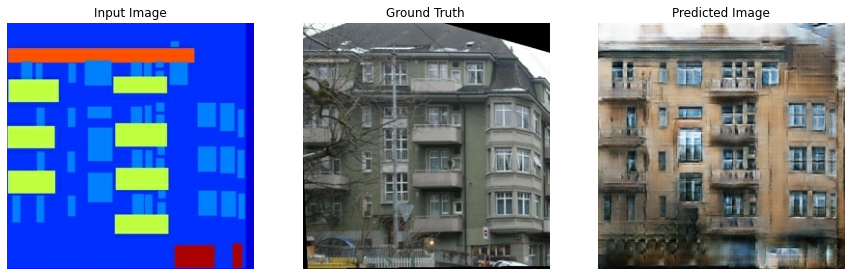

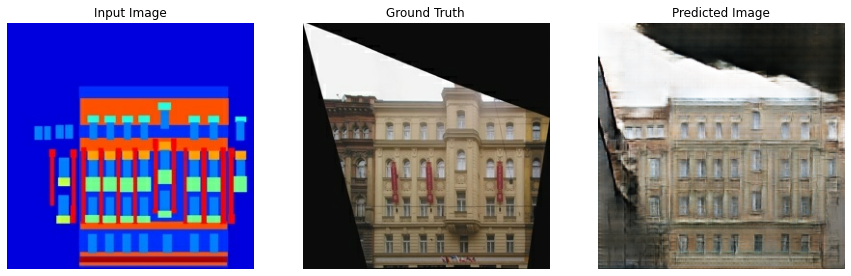

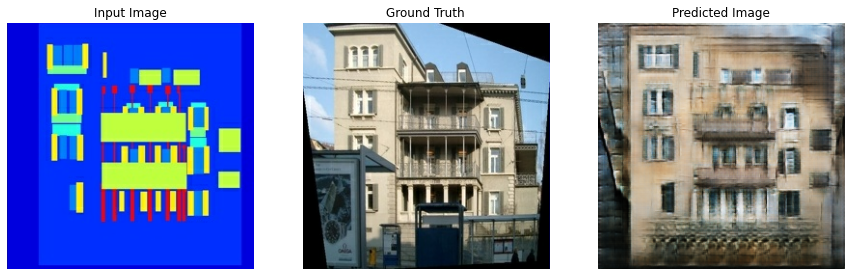

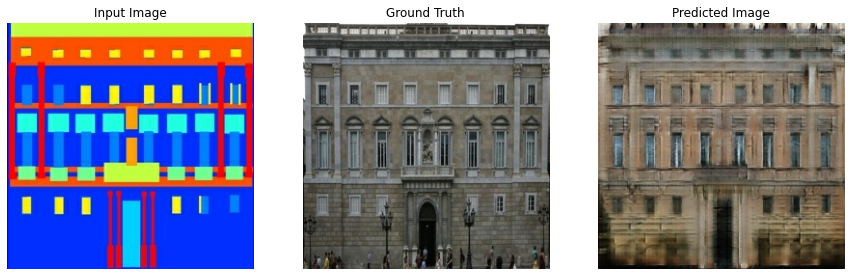

In [46]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

Baseado nos exemplos do tensorflow [tutorials](https://www.tensorflow.org/tutorials)


### Teste com máscaras criadas (obs.: imagens anexadas)

(256, 256, 3) (256, 256, 3) (256, 256, 3)


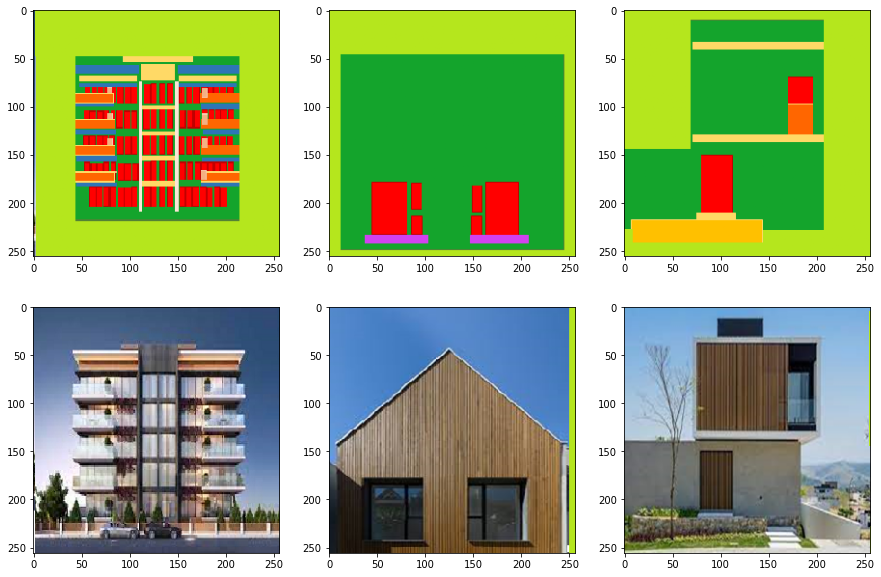

In [53]:
from IPython.core.pylabtools import figsize
## Carregando imagens
 
label1, facade1 = load(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada1_co.png'))
label2, facade2 = load(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada2_co.png'))
label3, facade3 = load(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada3_co.png'))
 
print(label1.shape, label2.shape, label3.shape)
_, axis = plt.subplots(ncols=3, nrows=2, figsize=(15, 10))
axis[0,0].imshow(label1/255.0)
axis[0,1].imshow(label2/255.0)
axis[0,2].imshow(label3/255.0)
axis[1,0].imshow(facade1/255.0)
axis[1,1].imshow(facade2/255.0)
axis[1,2].imshow(facade3/255.0)

# Para realizar o pré-processamento
label1, facade1 = load_image_test(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada1_co.png'))
label2, facade2 = load_image_test(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada2_co.png'))
label3, facade3 = load_image_test(str('/content/drive/MyDrive/disciplinasDoutorado/PCC177-2022-1(Redes)/lab6/label_fachada3_co.png'))



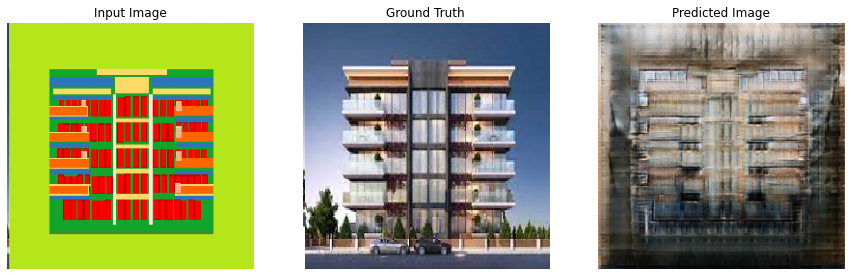

In [51]:
## Gera facade1

generate_images(generator, tf.expand_dims(label1, axis=0), tf.expand_dims(facade1, axis=0))

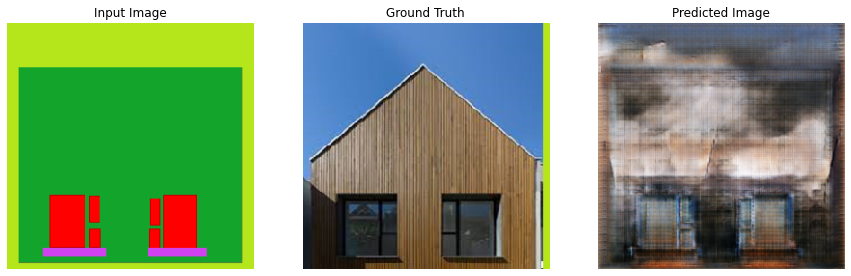

In [54]:
## Gera facade2
generate_images(generator, tf.expand_dims(label2, axis=0), tf.expand_dims(facade2, axis=0))

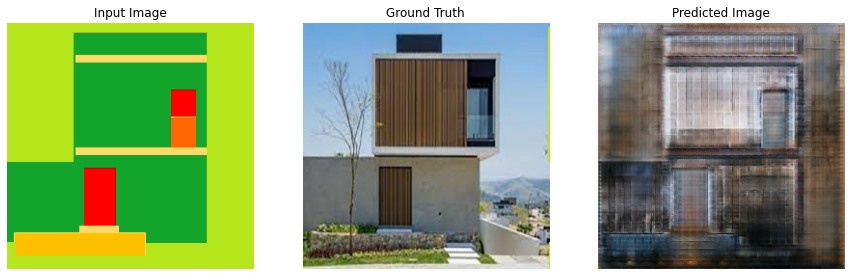

In [55]:
## Gera facade3
generate_images(generator, tf.expand_dims(label3, axis=0), tf.expand_dims(facade3, axis=0))